# Data Analysis and Visualisation
## 1. Import Libraries

In [1]:
import os, math, import_ipynb, mpld3
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
from scipy.fftpack import fft
from scipy import signal 
from util import *
%matplotlib inline
mpld3.enable_notebook()

importing Jupyter notebook from util.ipynb


## 2. Global Parameters

In [2]:
# Global Configuration Dictionary for Plot Customisation
# use pylab.rcParams.update(params) to update settings
params = {'lines.linewidth' : 1,
          'legend.fontsize': 'x-large',
          'legend.loc': 'best',
          'figure.figsize': (17, 10),
         'axes.labelsize': 'large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}

# Default mappings
df_column_mapping = {
    'x' : 3,
    'y' : 4,
    'z' : 5
}
axis_listing = ['x', 'y', 'z']

# Frequency presets
fs = 512 # sampling frequency
cutoff = 10 # cut-off frequency

# Window size presets
window = 3
max_window = 30

## 3. Process Data and Plot

'C:\\Users\\liong\\Jupyter Notebook\\191020_Fourth Year Project\\Parkinson-Disease-Repository\\Data\\Patient001-2019-12-05'

mean  \
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (g)        0.9723   
                                                   frequency (Hz)       2.8080   
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (deg/s)  119.6156   
                                                   frequency (Hz)       5.4712   
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (g)        0.7078   
                                                   frequency (Hz)       3.4236   
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (deg/s)  100.1254   
                                                   frequency (Hz)       4.5027   

                                                                           std  
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (g)        1.3336  
                                                   frequency (Hz)       3.4208  
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (deg/s)  156.9100  
                                                   frequency (Hz)       8.0568  
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (g)        1.2819  
                                                   frequency (Hz)       4.9646  
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (deg/s)  157.1463  
                                                   frequency (Hz)       6.3634

'ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C49948A1895C_Accelerometer_1.4.5.csv'

,elapsed (s),x-axis (g),y-axis (g),z-axis (g)
25%,24.3808,0.2330,0.1840,0.7940
50%,48.7605,0.3540,0.2500,0.8380
75%,73.1410,0.4780,0.3210,0.9010
count,4908.0000,4908.0000,4908.0000,4908.0000
max,97.5210,0.8370,0.7680,2.0160
mean,48.7604,0.3359,0.1963,0.7907
min,0.0000,-0.3310,-1.0080,-1.1840
std,28.1606,0.1817,0.2786,0.3385


,x-axis resultant (g),y-axis resultant (g),z-axis resultant (g),magnitude (g),rolling maximum magnitude (g),frequency (Hz),rolling maximum frequency (Hz)
25%,-0.0117,-0.0060,-0.0103,0.0536,0.1351,0.7143,0.7143
50%,0.0000,0.0003,-0.0003,0.2069,0.6936,1.4286,2.1429
75%,0.0087,0.0096,0.0063,1.6190,4.5143,5.0000,5.7143
count,4906.0000,4906.0000,4906.0000,4906.0000,4877.0000,4837.0000,4808.0000
max,0.4667,0.3357,0.5400,6.3910,6.3910,24.2857,24.2857
mean,-0.0000,0.0000,0.0000,0.9723,2.0649,2.8080,4.5791
min,-0.4810,-0.3413,-0.5127,0.0033,0.0468,0.0000,0.7143
std,0.1036,0.0599,0.1183,1.3336,2.2081,3.4208,5.7680


'ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C49948A1895C_Gyroscope_1.4.5.csv'

,elapsed (s),x-axis (deg/s),y-axis (deg/s),z-axis (deg/s)
25%,24.3808,-1.1680,-2.8770,-1.7627
50%,48.7605,0.8310,0.3510,-0.1910
75%,73.1410,4.2147,4.6190,1.3130
count,4908.0000,4908.0000,4908.0000,4908.0000
max,97.5210,249.7480,165.7160,141.9440
mean,48.7604,0.7514,-0.1309,-0.6701
min,0.0000,-241.4330,-168.2010,-147.0430
std,28.1606,38.2133,24.5914,15.4512


,x-axis resultant (deg/s),y-axis resultant (deg/s),z-axis resultant (deg/s),magnitude (deg/s),rolling maximum magnitude (deg/s),frequency (Hz),rolling maximum frequency (Hz)
25%,-0.6774,-1.7573,-0.7949,5.7347,18.4282,0.7143,0.7143
50%,0.0150,0.0075,-0.0127,30.5027,118.8887,0.7143,2.8571
75%,1.2029,1.8222,0.4647,207.0710,545.1646,5.0000,22.1429
count,4906.0000,4906.0000,4906.0000,4906.0000,4877.0000,4837.0000,4808.0000
max,66.3030,82.1647,24.7560,843.8951,843.8951,25.0000,25.0000
mean,0.0004,-0.0003,-0.0002,119.6156,262.8809,5.4712,8.9018
min,-61.5470,-65.8840,-36.3613,0.2889,4.3180,0.0000,0.7143
std,12.5016,15.1856,4.2013,156.9100,265.5691,8.0568,9.8265


'ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49948A1895C_Accelerometer_1.4.5.csv'

,elapsed (s),x-axis (g),y-axis (g),z-axis (g)
25%,28.9812,0.1360,0.1290,0.8960
50%,57.9625,0.2040,0.1735,0.9170
75%,86.9428,0.2737,0.2420,0.9370
count,5834.0000,5834.0000,5834.0000,5834.0000
max,115.9220,0.7300,1.0410,2.5890
mean,57.9619,0.2010,0.1199,0.8258
min,0.0000,-0.4640,-0.9440,-1.5510
std,33.4725,0.1239,0.2938,0.3927


,x-axis resultant (g),y-axis resultant (g),z-axis resultant (g),magnitude (g),rolling maximum magnitude (g),frequency (Hz),rolling maximum frequency (Hz)
25%,-0.0064,-0.0040,-0.0050,0.0509,0.1172,0.7143,0.7143
50%,-0.0003,-0.0000,0.0000,0.1085,0.2694,1.4286,3.5714
75%,0.0053,0.0040,0.0057,0.8062,4.8756,4.2857,5.0000
count,5832.0000,5832.0000,5832.0000,5832.0000,5803.0000,5763.0000,5734.0000
max,0.4370,0.3517,0.9300,10.3131,10.3131,24.2857,24.2857
mean,-0.0000,-0.0000,0.0000,0.7078,2.0312,3.4236,5.9571
min,-0.3650,-0.2580,-1.0280,0.0046,0.0310,0.0000,0.7143
std,0.0647,0.0428,0.1275,1.2819,2.7246,4.9646,7.2552


'ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49948A1895C_Gyroscope_1.4.5.csv'

,elapsed (s),x-axis (deg/s),y-axis (deg/s),z-axis (deg/s)
25%,28.9812,-1.1810,-2.5440,-2.4470
50%,57.9625,0.6940,0.0910,-0.2970
75%,86.9428,2.4980,2.1702,0.9130
count,5834.0000,5834.0000,5834.0000,5834.0000
max,115.9220,249.7480,208.0790,197.0960
mean,57.9619,0.7260,-0.3795,-0.9081
min,0.0000,-235.5560,-126.7990,-151.5320
std,33.4725,34.1134,25.9139,15.8286


,x-axis resultant (deg/s),y-axis resultant (deg/s),z-axis resultant (deg/s),magnitude (deg/s),rolling maximum magnitude (deg/s),frequency (Hz),rolling maximum frequency (Hz)
25%,-0.3833,-1.0855,-0.5157,6.8732,20.0016,0.7143,0.7143
50%,0.0610,0.0403,-0.0003,16.9915,47.1064,1.4286,2.8571
75%,0.8087,1.3757,0.4854,134.9516,455.4643,4.2857,13.5714
count,5832.0000,5832.0000,5832.0000,5832.0000,5803.0000,5763.0000,5734.0000
max,38.6100,81.9590,26.2470,982.6643,982.6643,23.5714,23.5714
mean,0.0008,0.0002,0.0004,100.1254,237.2864,4.5027,6.9122
min,-73.5543,-92.3553,-30.1220,0.5133,3.3676,0.0000,0.7143
std,9.7121,15.9313,3.5589,157.1463,285.3550,6.3634,7.7506


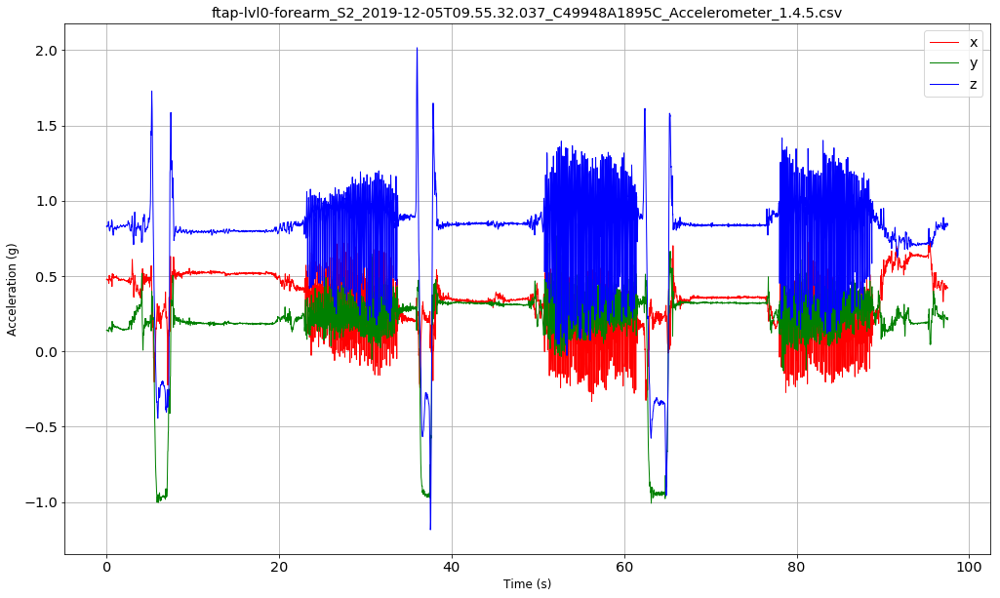

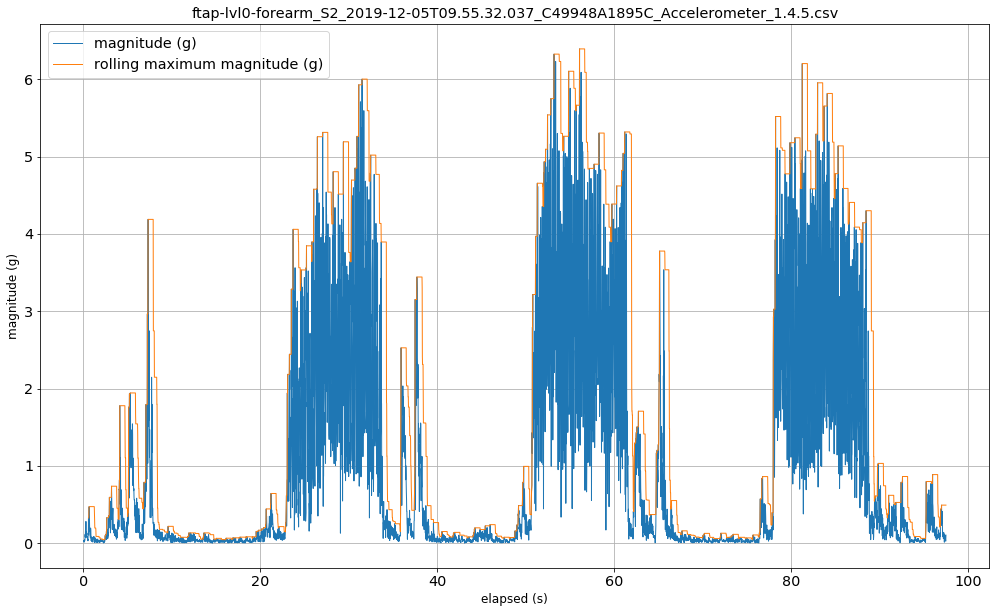

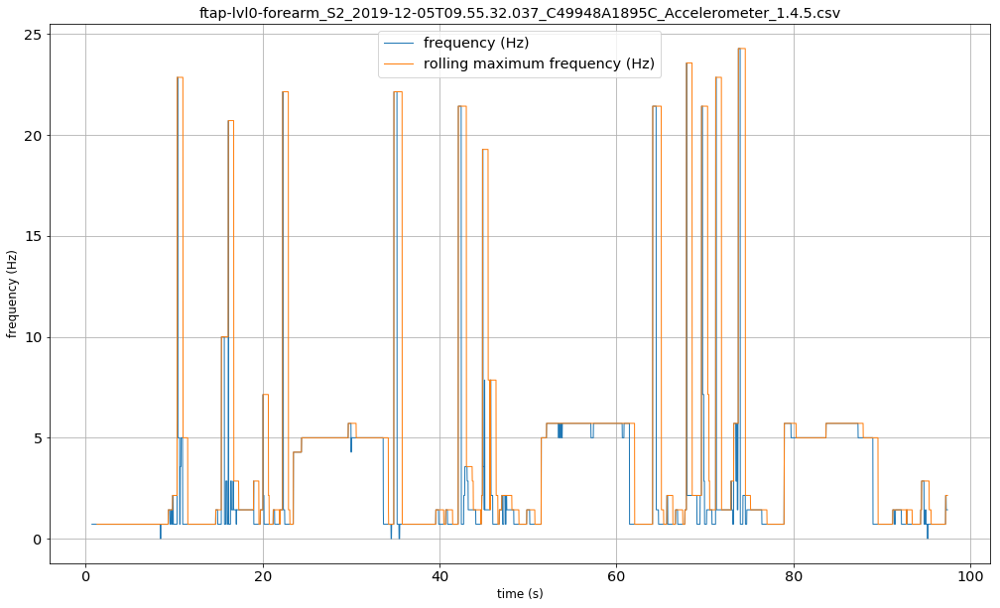

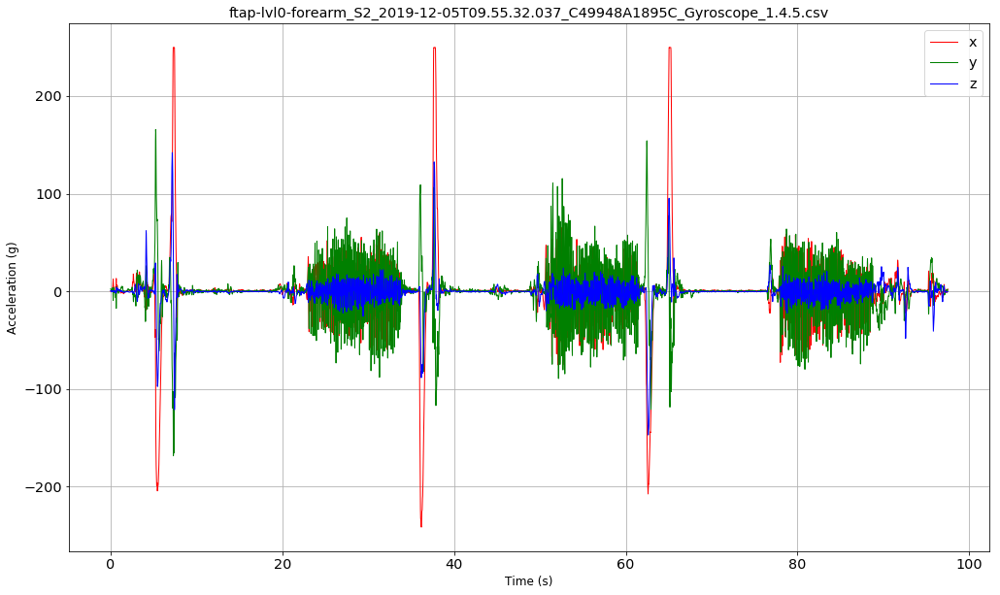

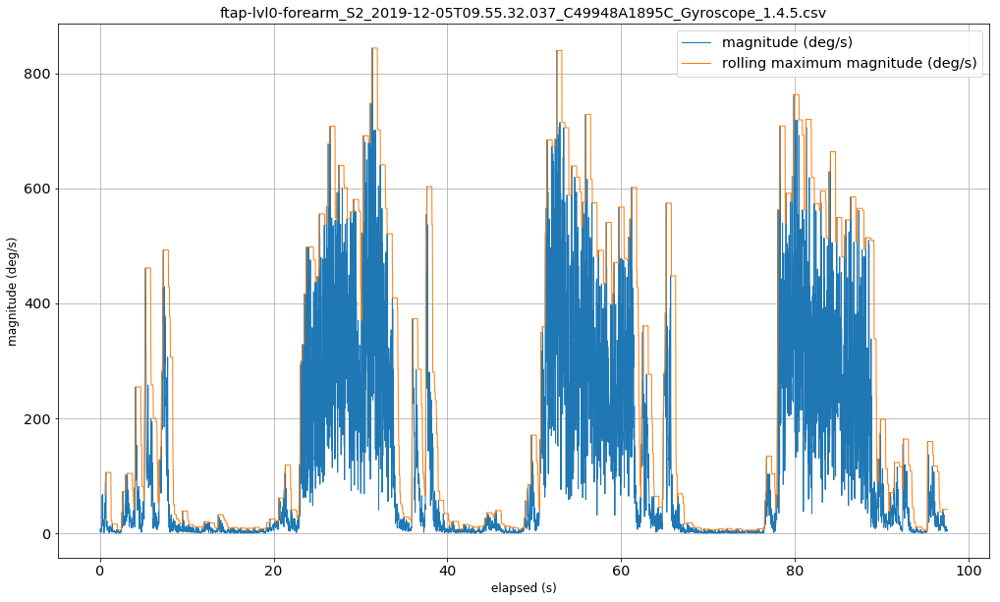

...

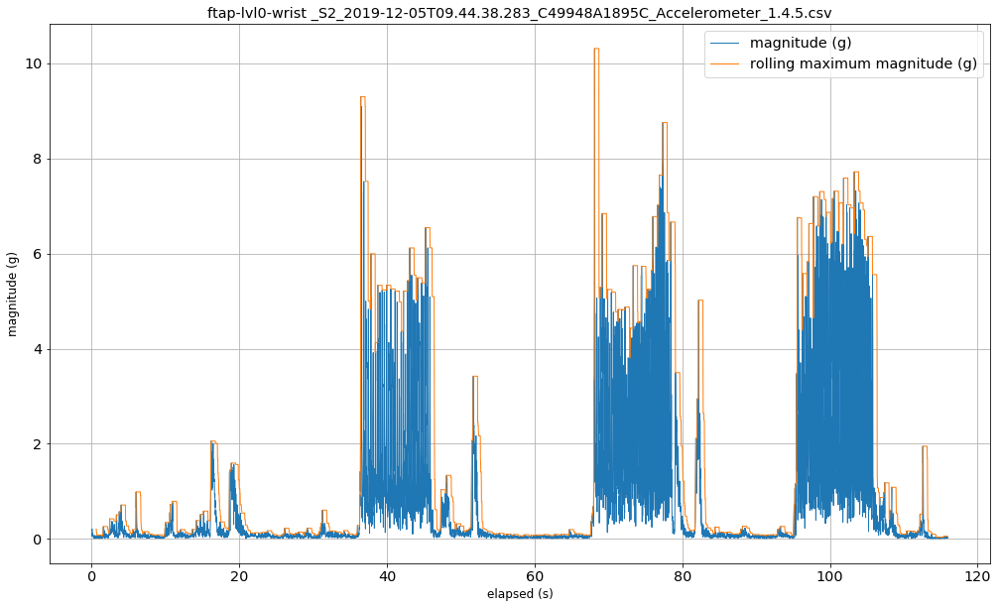

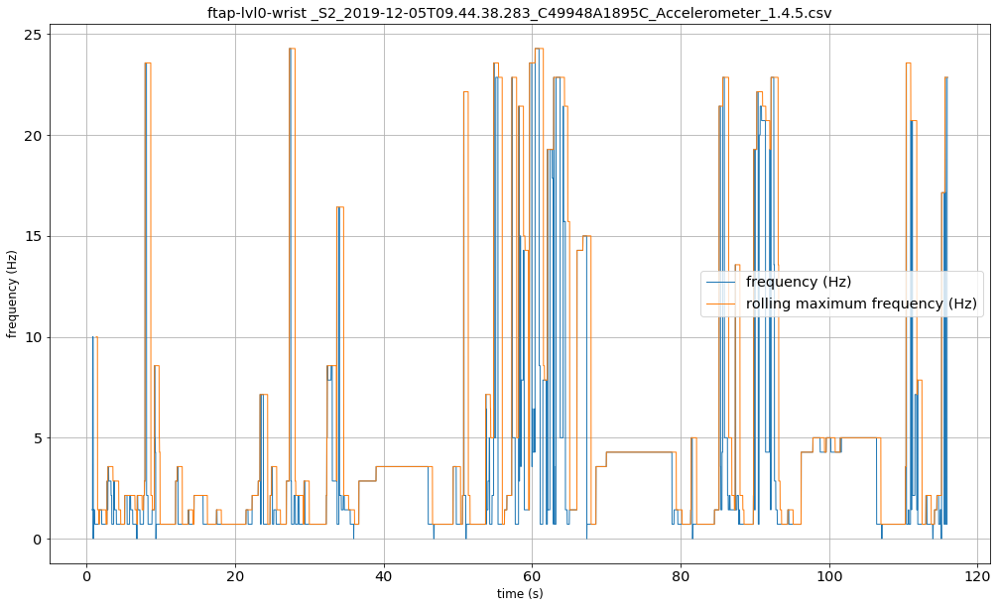

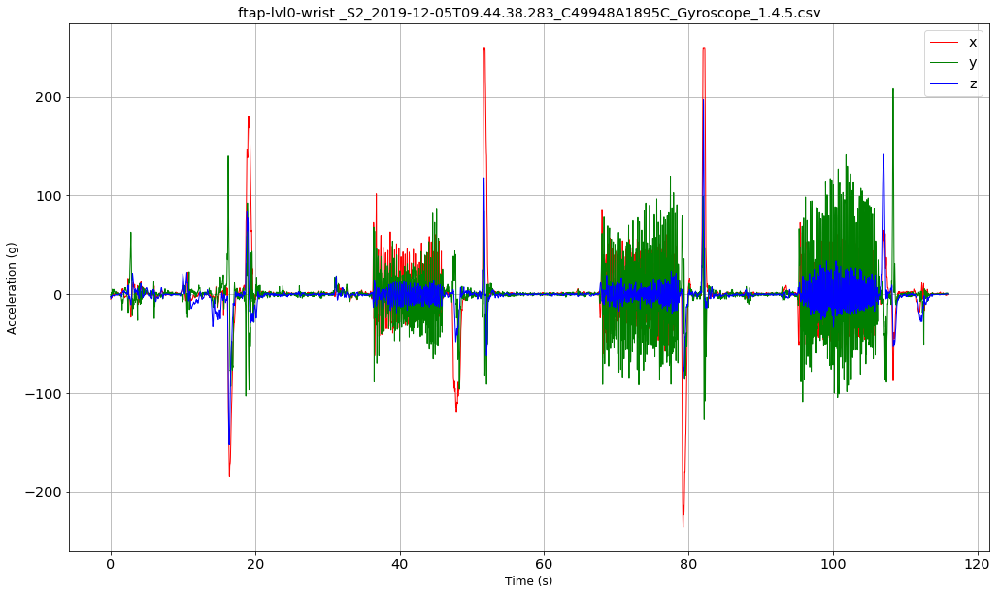

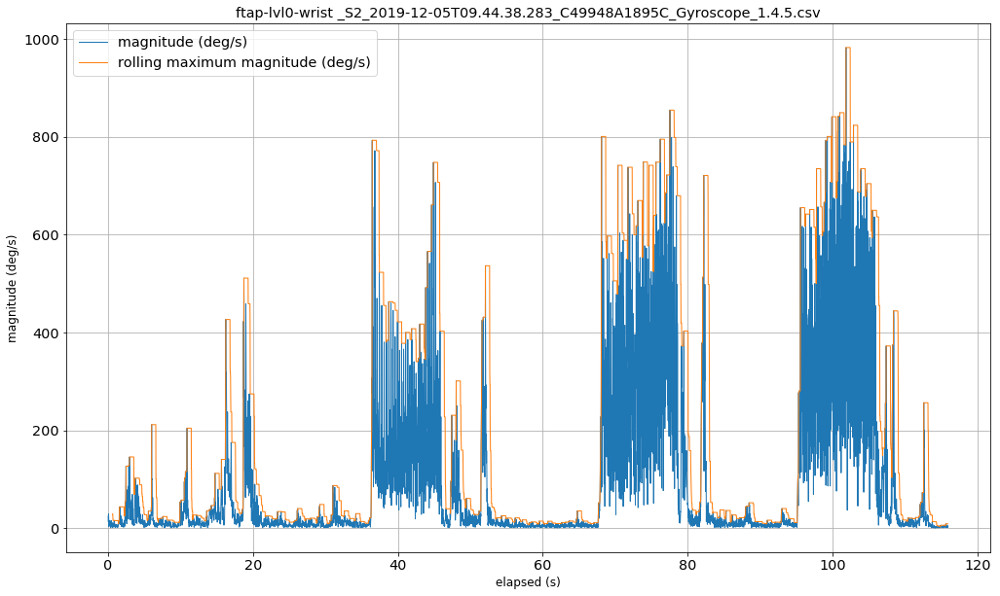

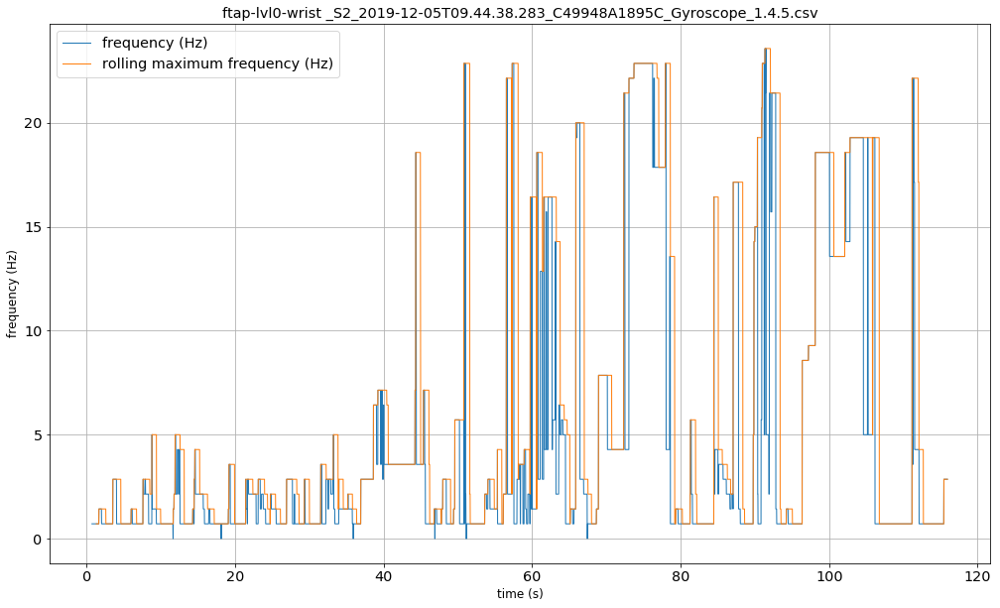

In [3]:
# ======================================================================
# Edit the input variable below to change to the folder path of interest
# ======================================================================
working_path = get_folder_path("Patient001-2019-12-05")

# Data Overview
display(working_path)
df_tabulated_stats = tabulate_all_stats(working_path, 4, 3, 30)
display(df_tabulated_stats)

# File and directory management
os.chdir(working_path)
directory = os.listdir()

for file in directory:
    display(file)
    df = read_csv_file(file)
    if df is None:
        continue

    # ==============================================
    # Data Pre-processing
    # ==============================================
    df_processed = process_dataframe(df, file, window, max_window) 
    df_raw_stats = pd.DataFrame(collect_stats_from_unprocessed_data(df, file, 4))
    df_processed_stats = pd.DataFrame(collect_stats_from_processed_data(df_processed, file, 4))

    display(df_raw_stats)
    display(df_processed_stats)
    
    # ==============================================
    # Data Visualisation
    # ==============================================
    # Update plot customisation parameters
    pylab.rcParams.update(params)
    
    # Uncomment sections below to enable plots of interest
    plot_time_3_axes(df, t = file)
    plot_magnitude_frequency(df_processed, t = file)
    # plot_frequency(df, fs, t = file)

os.chdir('..')

# 4.0 Truncated Data Analysis

mean  \
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (g)   1.8749   
                                                   frequency (Hz)  4.5424   

                                                                      std  
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (g)   1.3732  
                                                   frequency (Hz)  3.4424

mean  \
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (g)   2.6031   
                                                   frequency (Hz)  4.8974   

                                                                      std  
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (g)   1.3425  
                                                   frequency (Hz)  1.7635

mean  \
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (g)   2.4448   
                                                   frequency (Hz)  4.7815   

                                                                      std  
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (g)   1.2710  
                                                   frequency (Hz)  1.5012

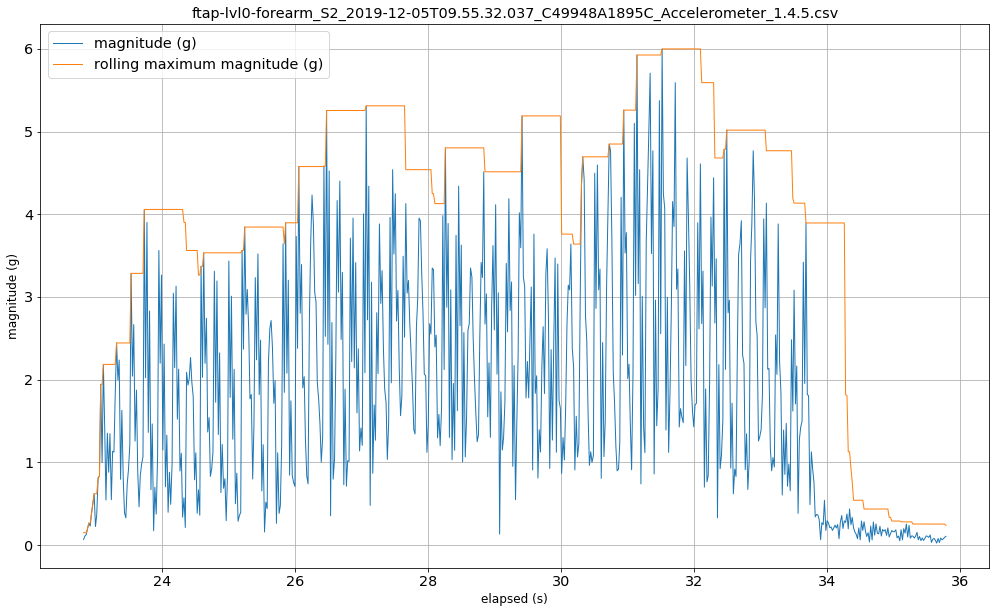

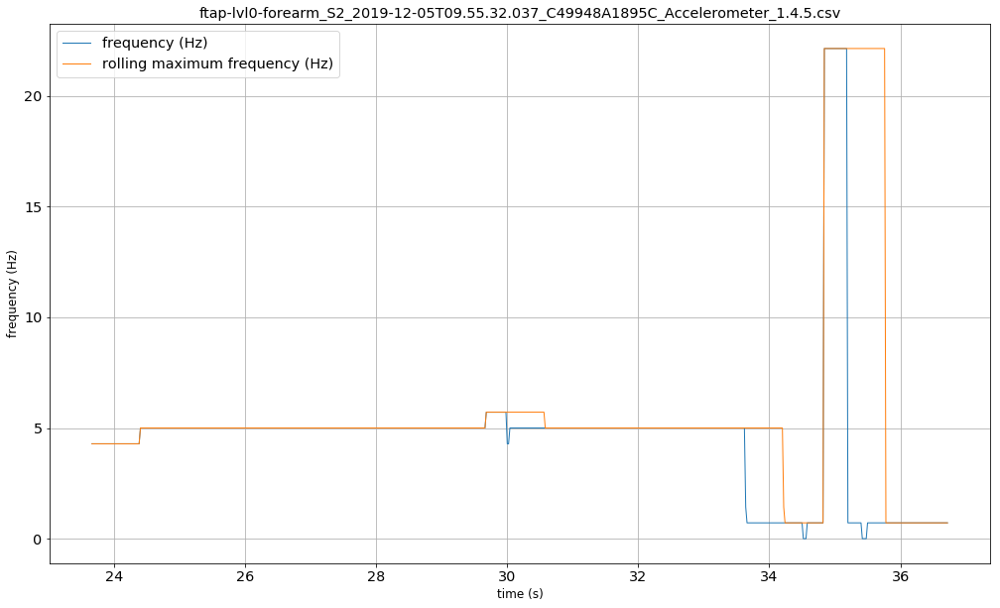

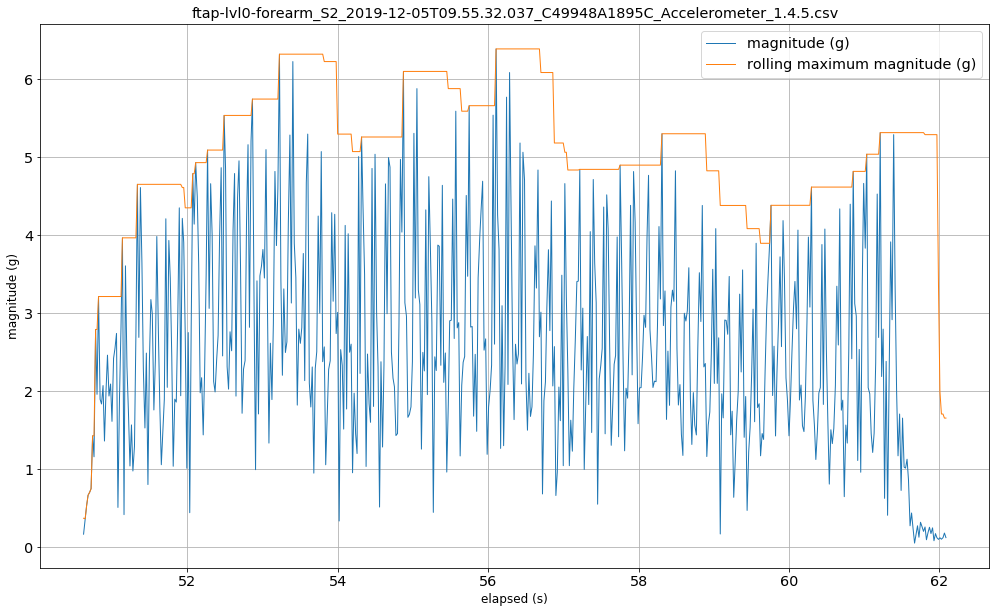

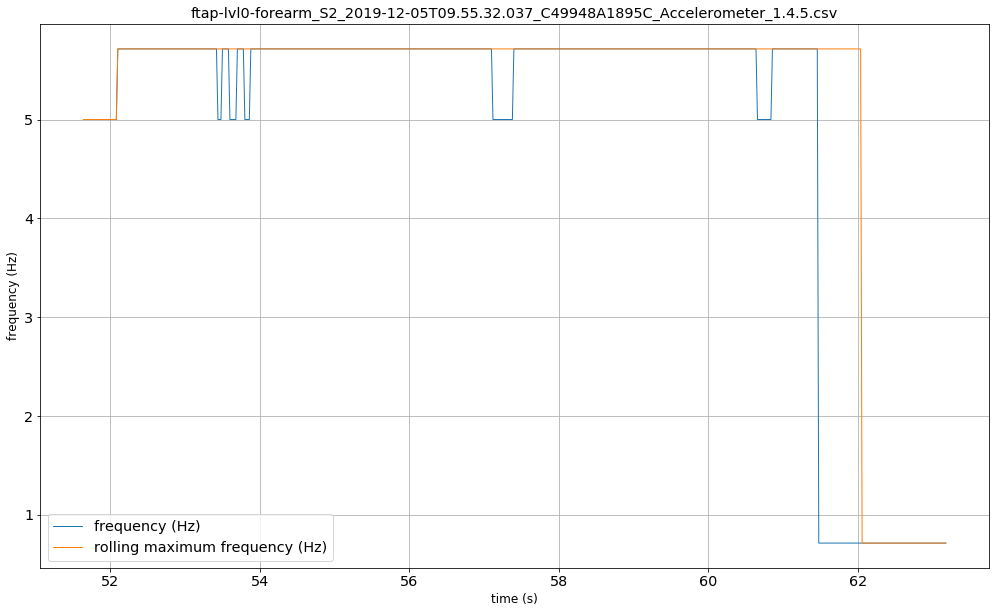

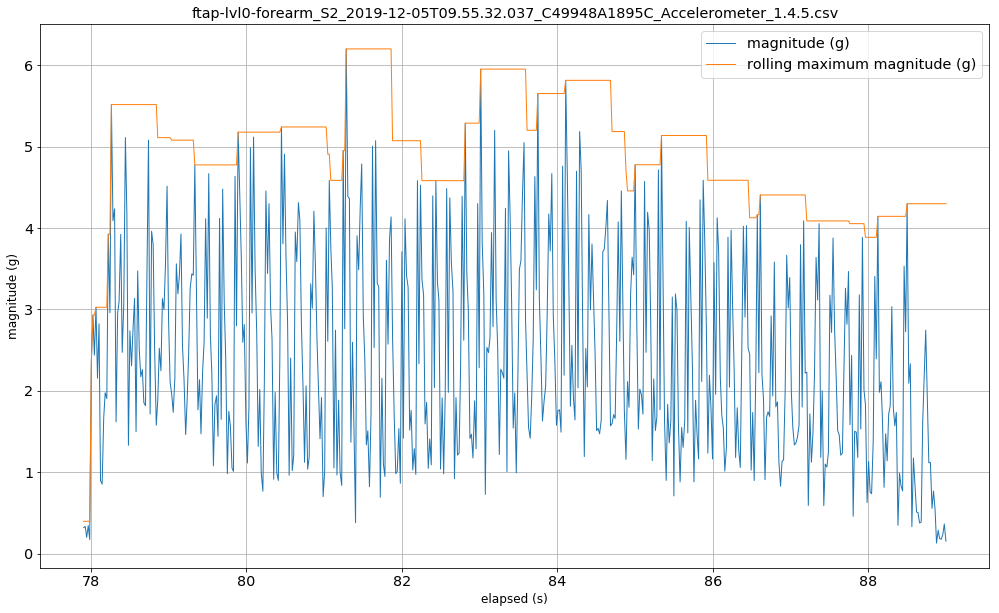

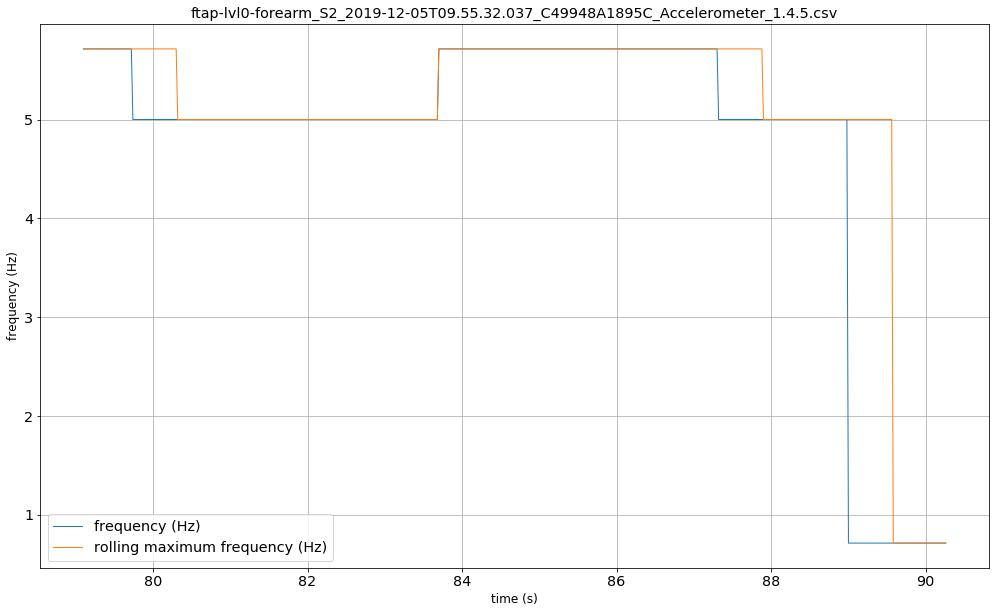

In [4]:
# ==============================================
# Truncated Data Analysis
# ==============================================
working_path = get_folder_path("Patient001-2019-12-05")
file = 'ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C49948A1895C_Accelerometer_1.4.5.csv'

# Data pre-processing
df = read_csv_file(os.path.join(working_path,file))
df_processed = process_dataframe(df, file, 3, 30)
df_1, df_2, df_3 = truncate_dataframe(working_path, file, 22.8, 35.8, 50.6, 62.1, 77.9, 89)

# Data statistics
df_1_stats = tabulate_stats(file, df_1, 4, 3, 30)
df_2_stats = tabulate_stats(file, df_2, 4, 3, 30)
df_3_stats = tabulate_stats(file, df_3, 4, 3, 30)
display(df_1_stats)
display(df_2_stats)
display(df_3_stats)

# Data visualisation
pylab.rcParams.update(params)
plot_magnitude_frequency(df_1, t = file)
plot_magnitude_frequency(df_2, t = file)
plot_magnitude_frequency(df_3, t = file)

mean  \
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (deg/s)  248.5550   
                                                   frequency (Hz)      14.1612   

                                                                           std  
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (deg/s)  170.0078  
                                                   frequency (Hz)      10.2840

mean  \
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (deg/s)  281.7970   
                                                   frequency (Hz)      11.0059   

                                                                           std  
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (deg/s)  152.8509  
                                                   frequency (Hz)       8.7963

mean  \
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (deg/s)  278.6668   
                                                   frequency (Hz)       9.9796   

                                                                           std  
ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C4... magnitude (deg/s)  143.4422  
                                                   frequency (Hz)       8.3330

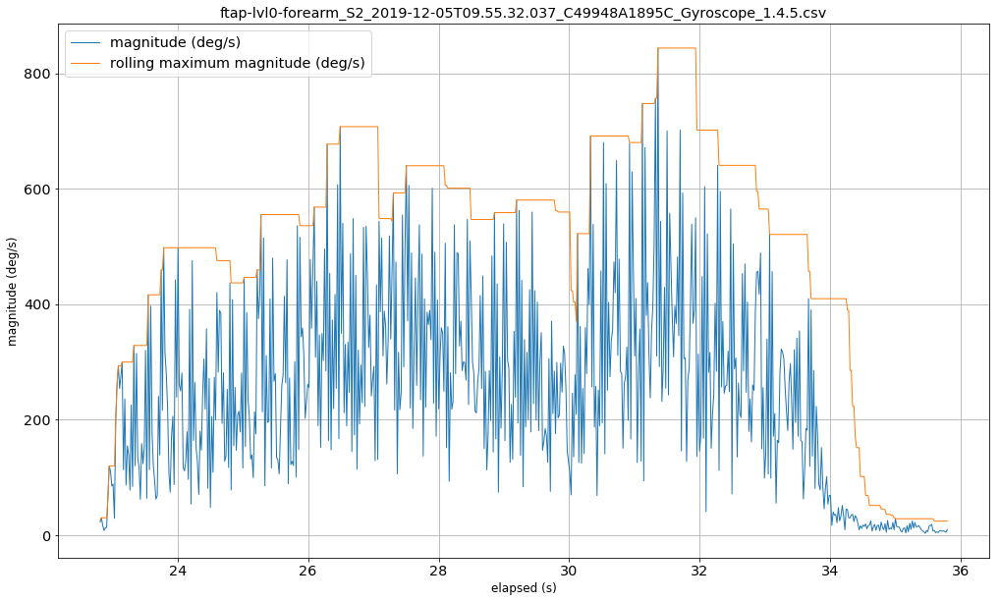

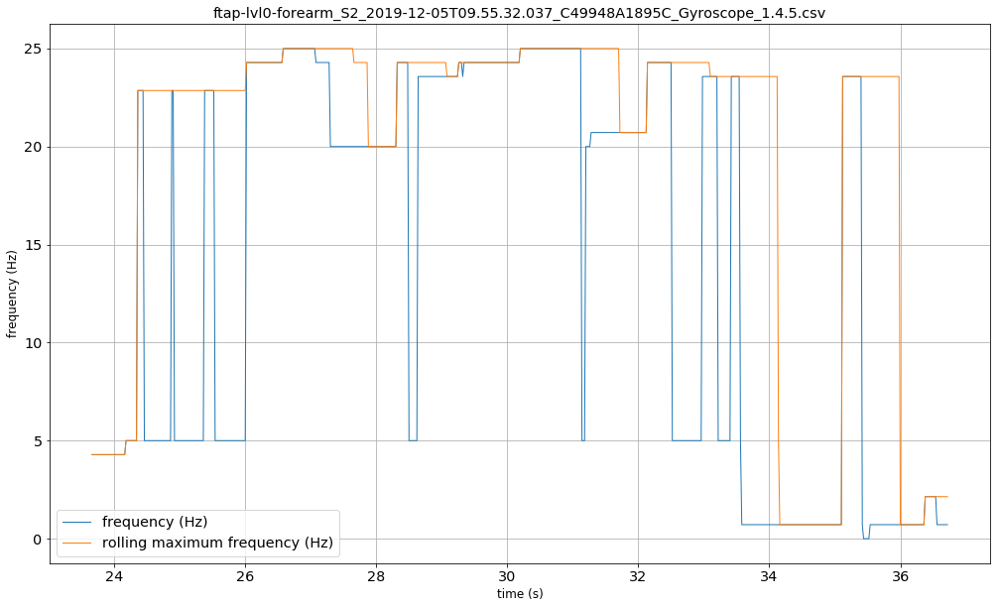

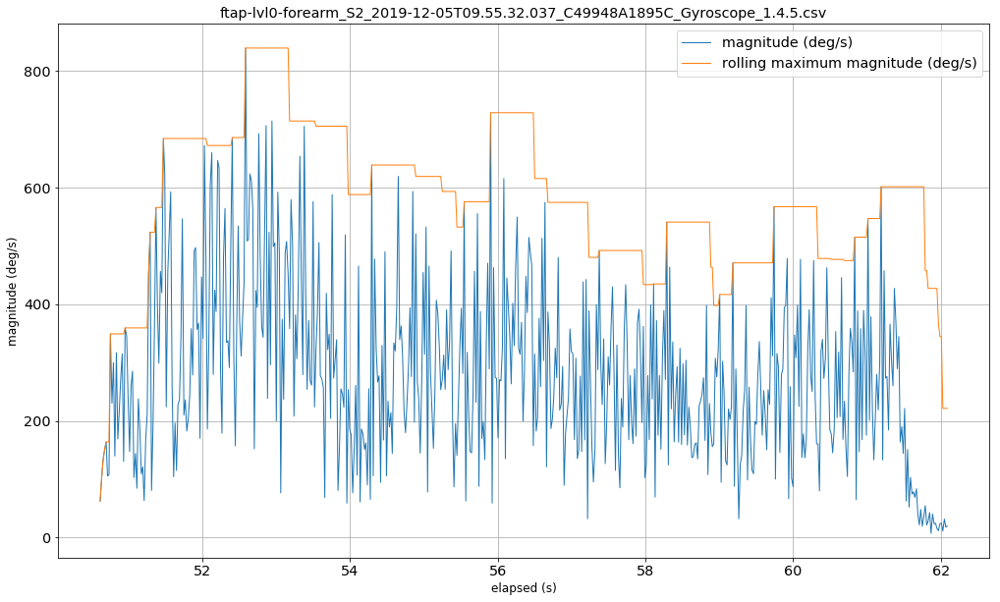

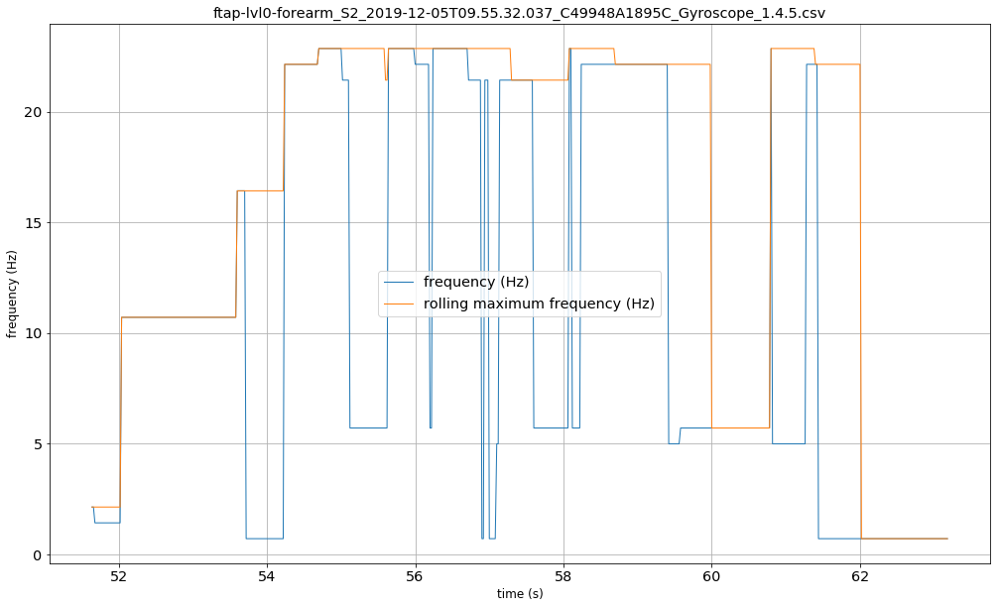

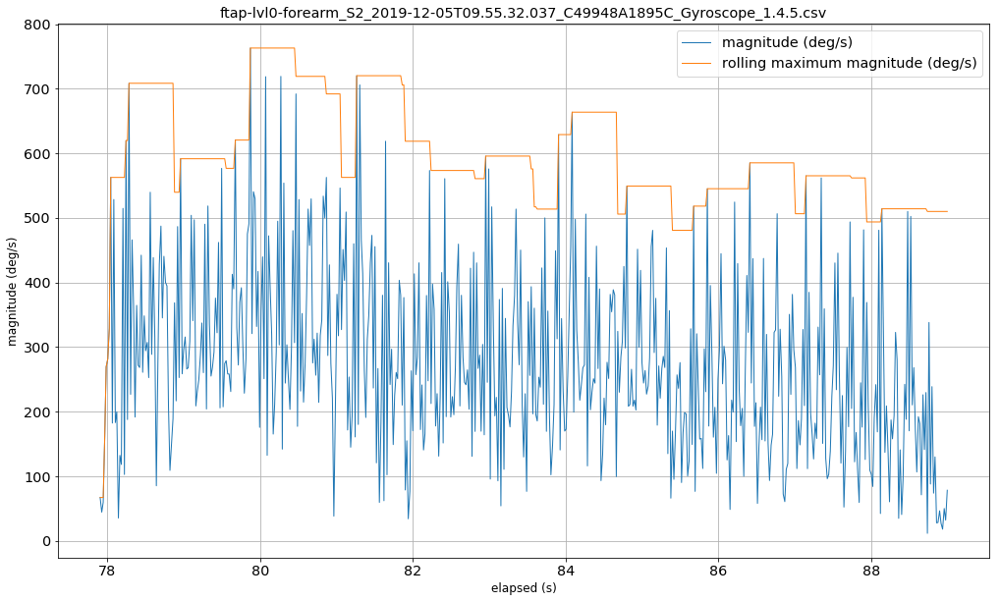

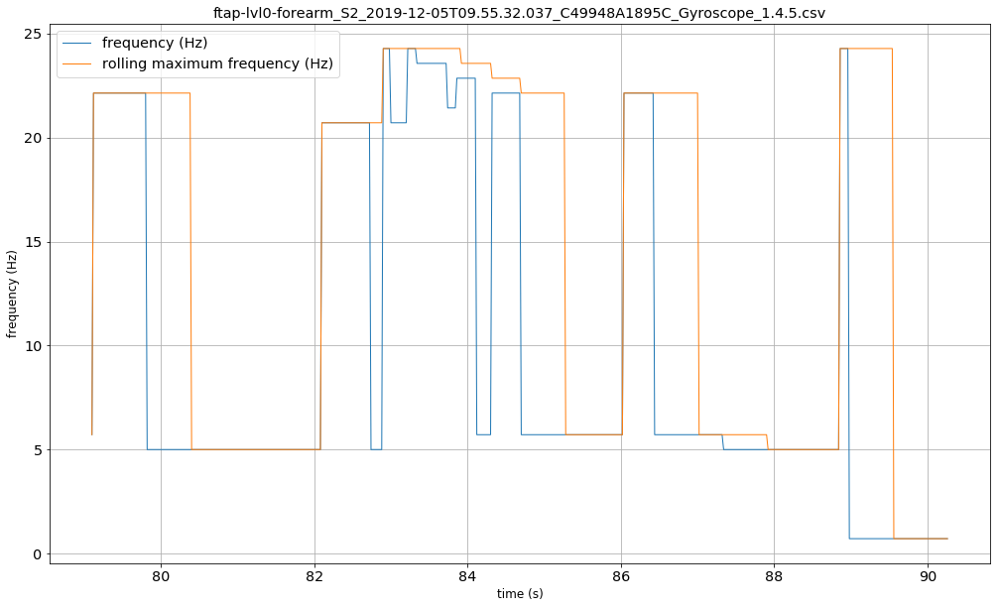

In [5]:
# ==============================================
# Truncated Data Analysis
# ==============================================
file = 'ftap-lvl0-forearm_S2_2019-12-05T09.55.32.037_C49948A1895C_Gyroscope_1.4.5.csv'

# Data pre-processing
df = read_csv_file(os.path.join(working_path,file))
df_processed = process_dataframe(df, file, 3, 30)
df_1, df_2, df_3 = truncate_dataframe(working_path, file, 22.8, 35.8, 50.6, 62.1, 77.9, 89)

# Data statistics
df_1_stats = tabulate_stats(file, df_1, 4, 3, 30)
df_2_stats = tabulate_stats(file, df_2, 4, 3, 30)
df_3_stats = tabulate_stats(file, df_3, 4, 3, 30)
display(df_1_stats)
display(df_2_stats)
display(df_3_stats)

# Data visualisation
pylab.rcParams.update(params)
plot_magnitude_frequency(df_1, t = file)
plot_magnitude_frequency(df_2, t = file)
plot_magnitude_frequency(df_3, t = file)

mean  \
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (g)   1.1871   
                                                   frequency (Hz)  2.3283   

                                                                      std  
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (g)   1.3718  
                                                   frequency (Hz)  1.6772

mean  \
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (g)   1.6522   
                                                   frequency (Hz)  3.1642   

                                                                      std  
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (g)   1.6170  
                                                   frequency (Hz)  2.5975

mean  \
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (g)   1.4133   
                                                   frequency (Hz)  3.7381   

                                                                      std  
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (g)   1.7809  
                                                   frequency (Hz)  3.8727

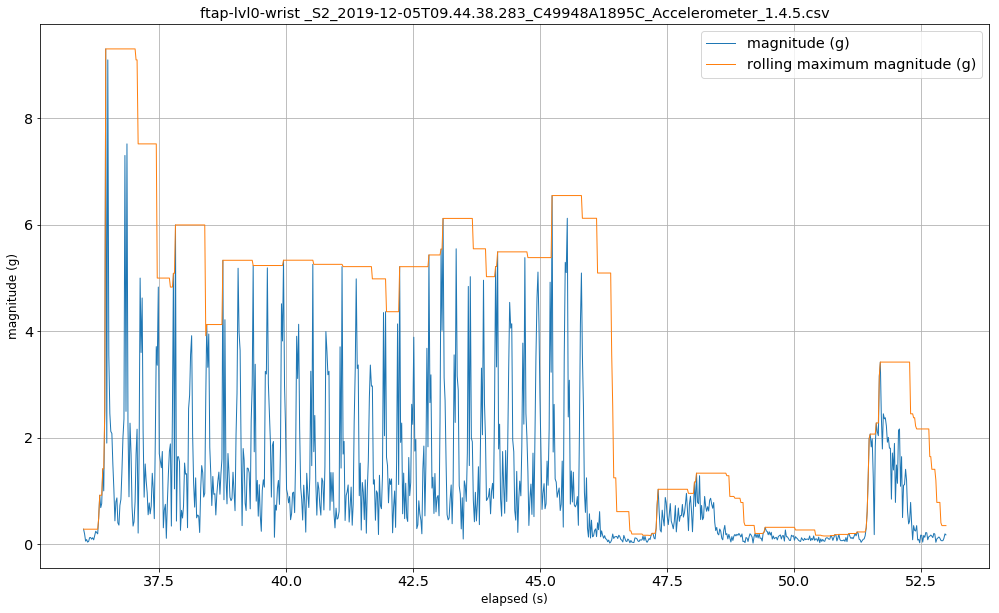

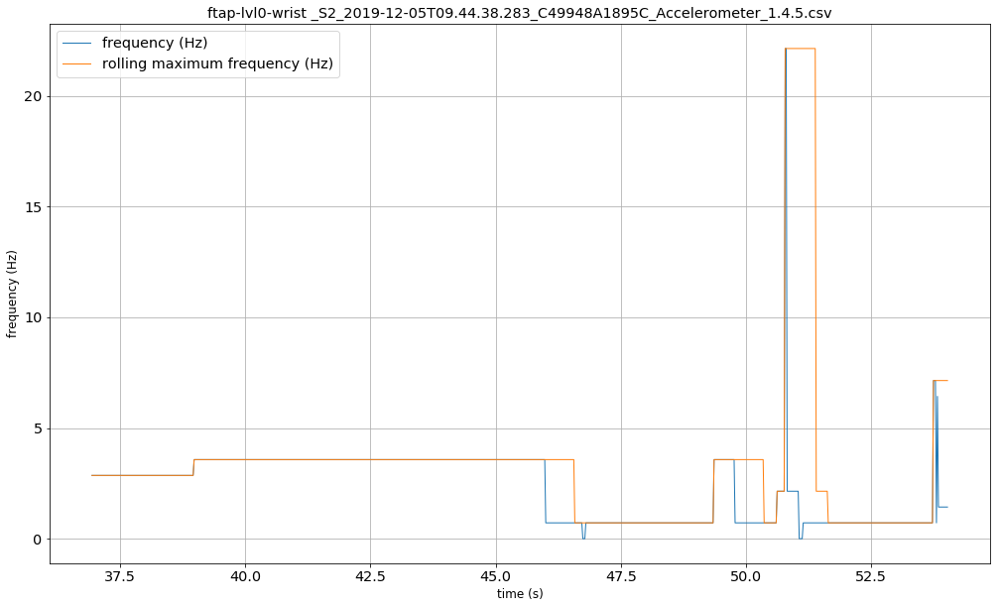

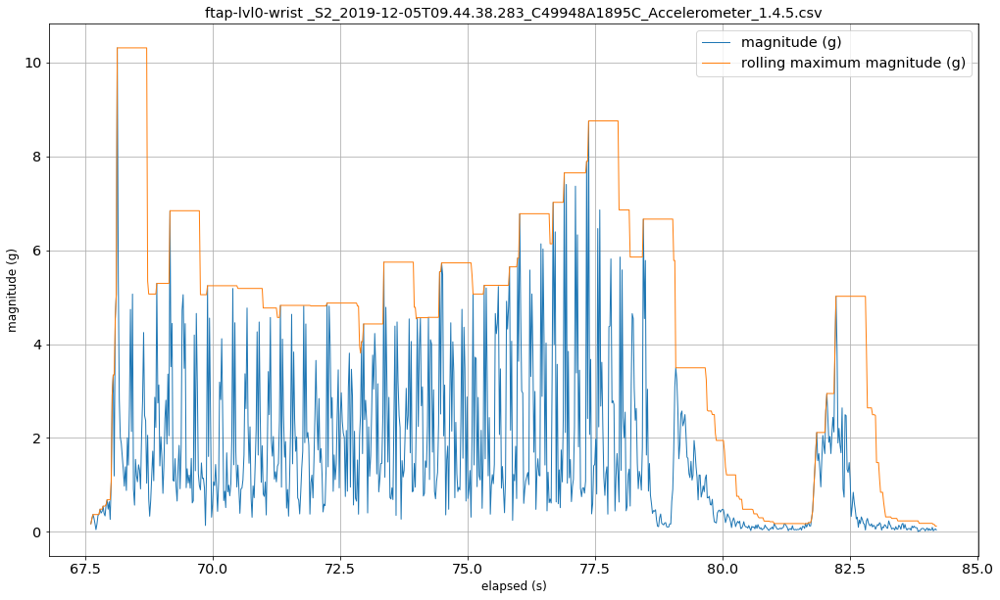

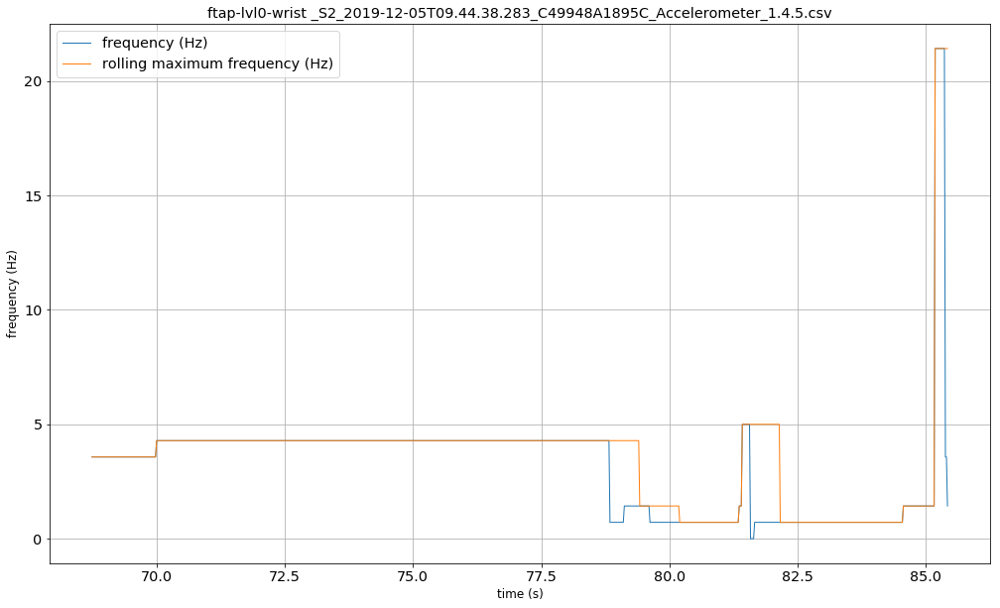

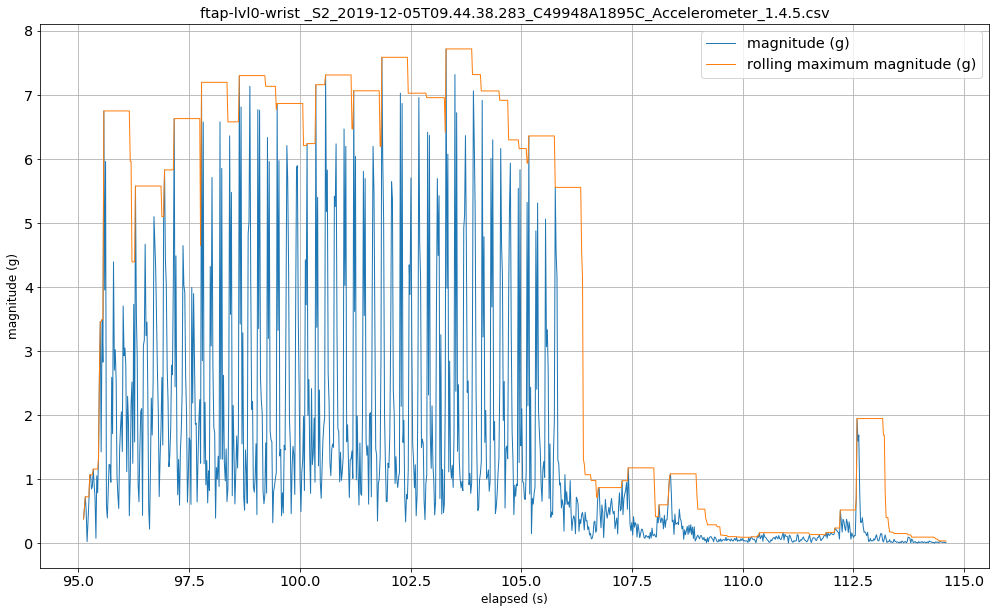

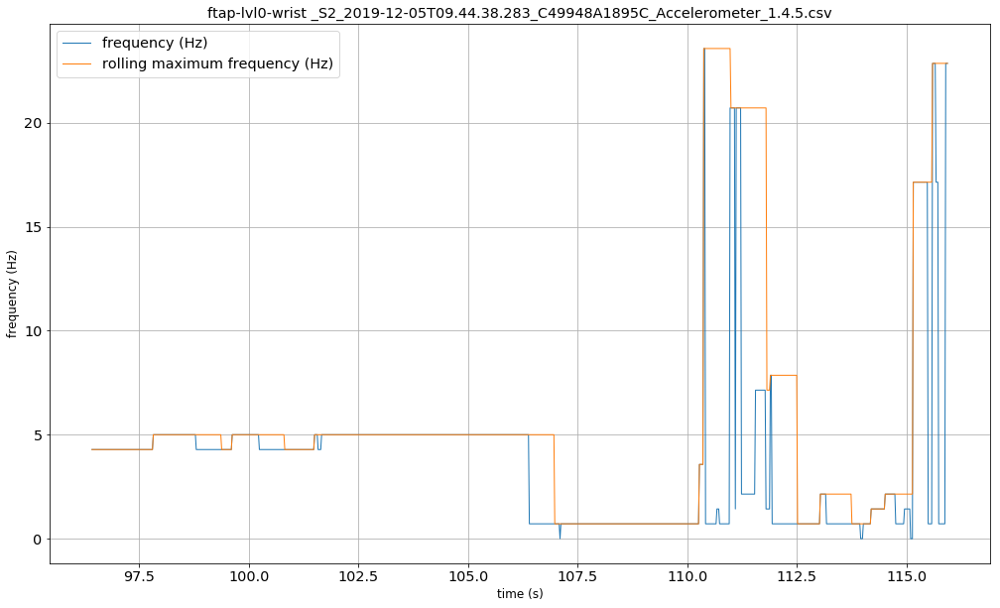

In [6]:
# ==============================================
# Truncated Data Analysis
# ==============================================
file = 'ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49948A1895C_Accelerometer_1.4.5.csv'

# Data pre-processing
df = read_csv_file(os.path.join(working_path,file))
df_processed = process_dataframe(df, file, 3, 30)
df_1, df_2, df_3 = truncate_dataframe(working_path, file, 36, 53, 67.6, 84.2, 95.1, 114.6)

# Data statistics
df_1_stats = tabulate_stats(file, df_1, 4, 3, 30)
df_2_stats = tabulate_stats(file, df_2, 4, 3, 30)
df_3_stats = tabulate_stats(file, df_3, 4, 3, 30)
display(df_1_stats)
display(df_2_stats)
display(df_3_stats)

# Data visualisation
pylab.rcParams.update(params)
plot_magnitude_frequency(df_1, t = file)
plot_magnitude_frequency(df_2, t = file)
plot_magnitude_frequency(df_3, t = file)

mean  \
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (deg/s)  136.7010   
                                                   frequency (Hz)       2.8663   

                                                                           std  
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (deg/s)  130.3774  
                                                   frequency (Hz)       2.7520

mean  \
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (deg/s)  229.2356   
                                                   frequency (Hz)       8.5697   

                                                                           std  
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (deg/s)  187.5704  
                                                   frequency (Hz)       8.7852

mean  \
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (deg/s)  221.4219   
                                                   frequency (Hz)       7.8337   

                                                                           std  
ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49... magnitude (deg/s)  214.6538  
                                                   frequency (Hz)       7.5478

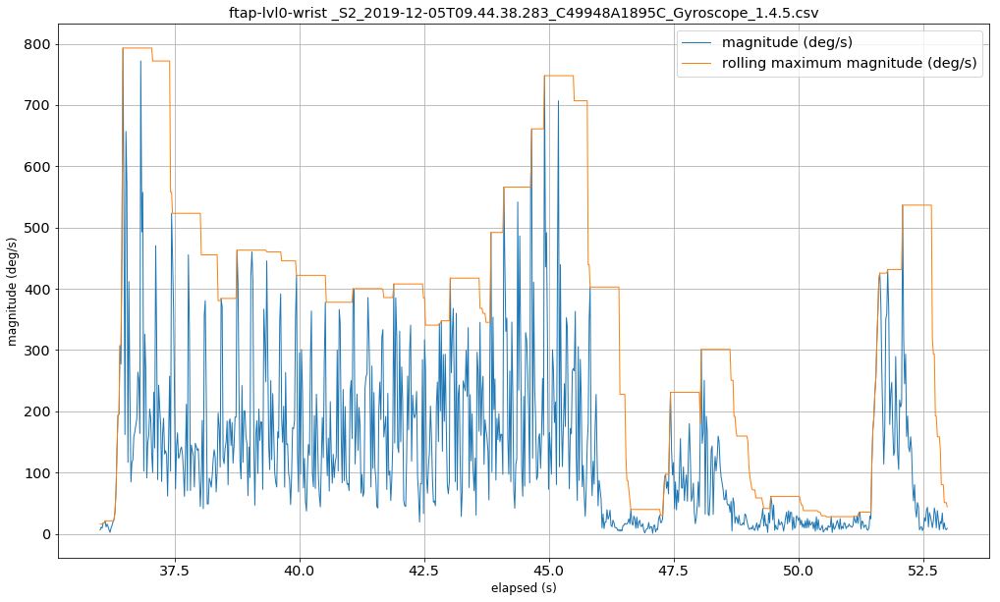

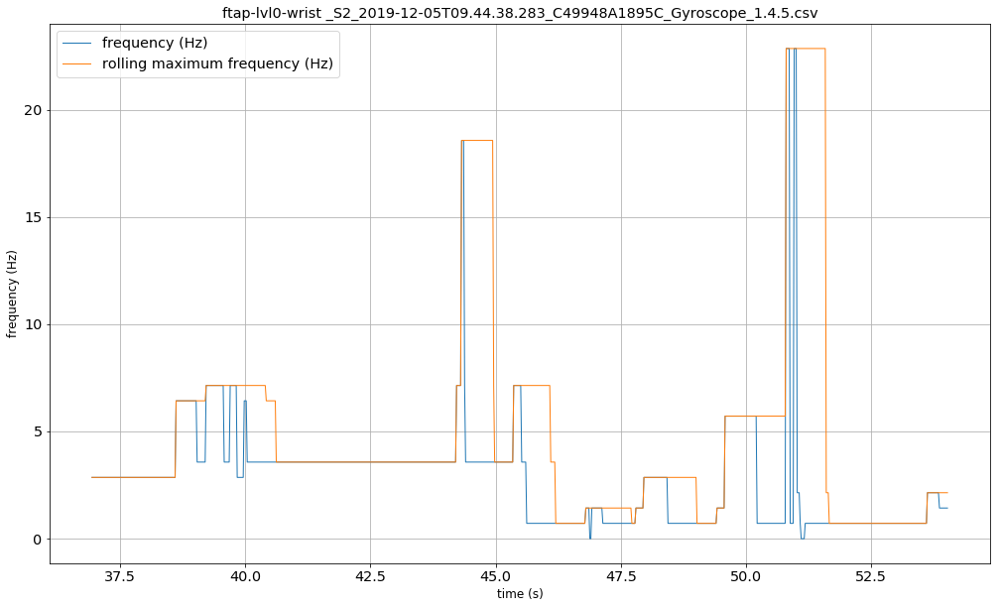

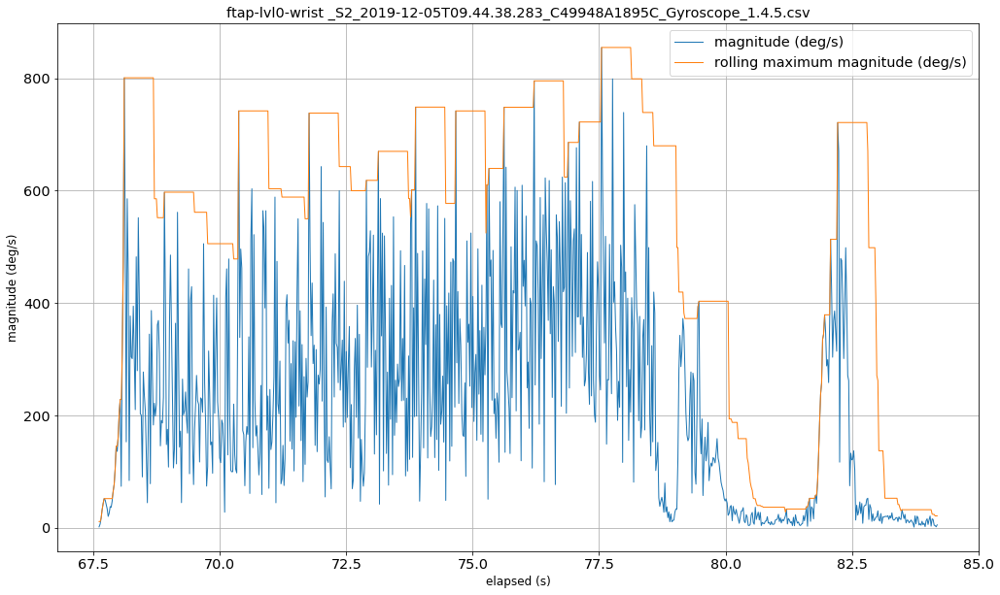

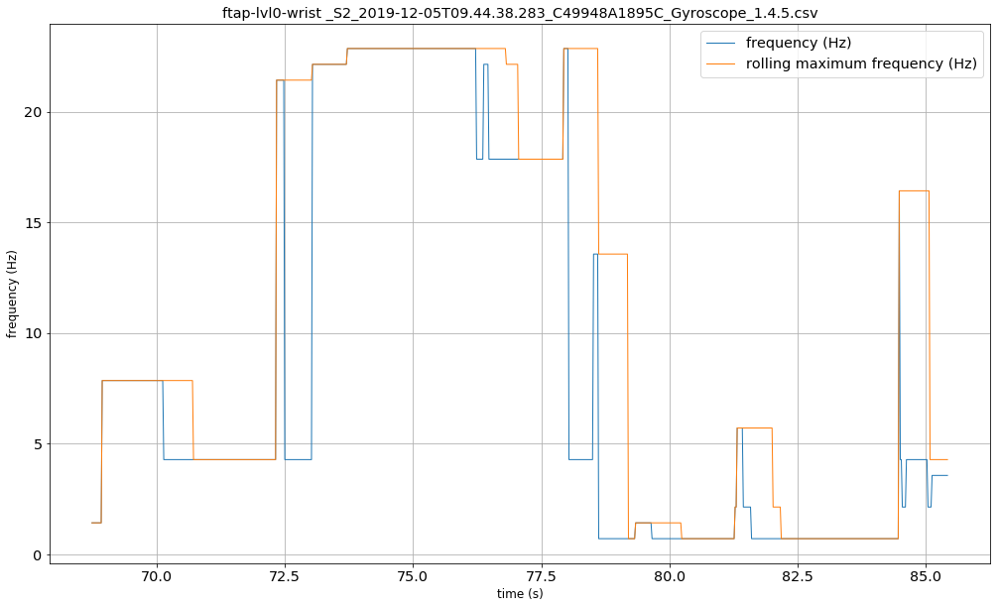

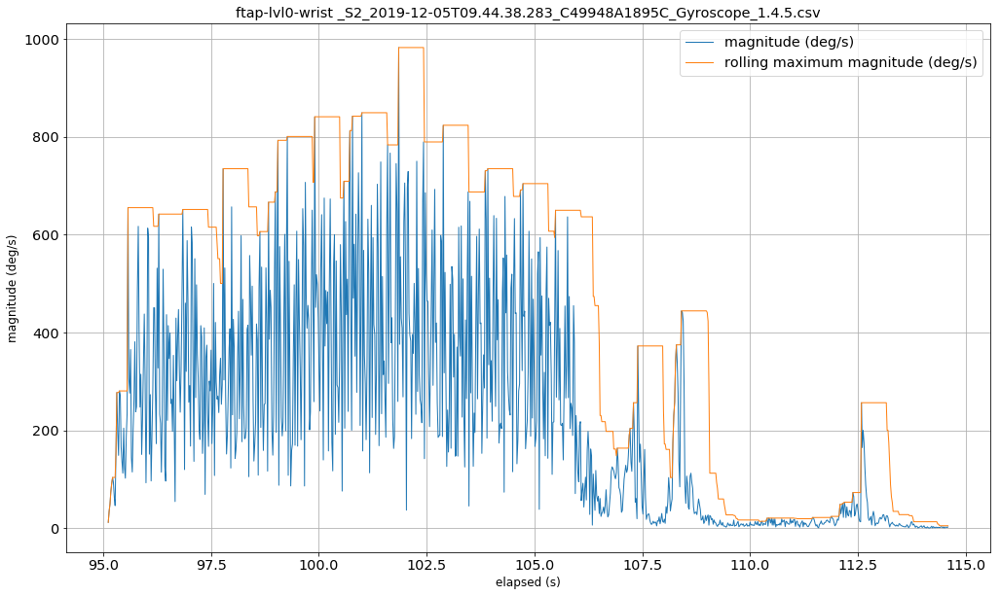

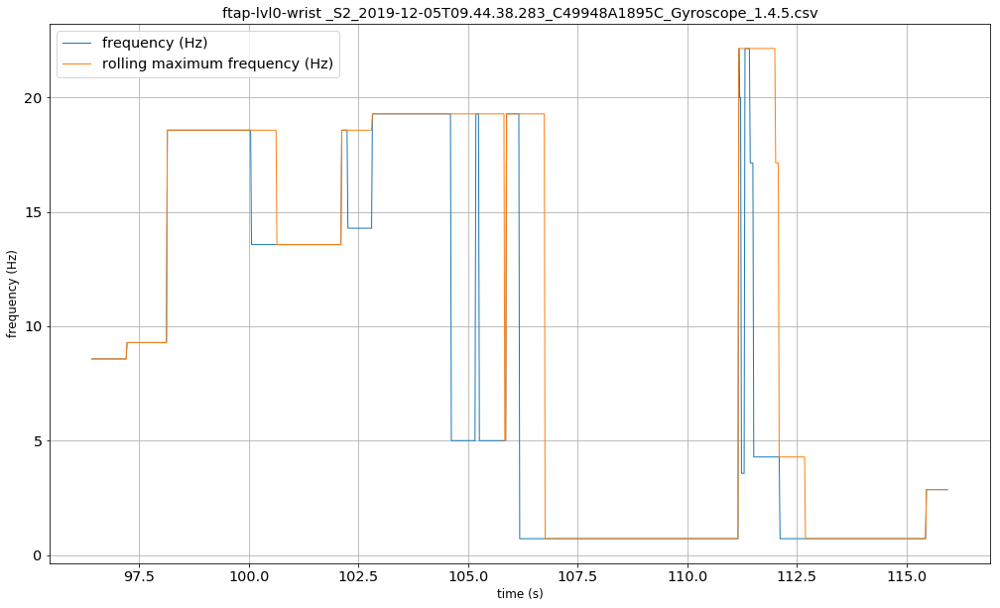

In [7]:
# ==============================================
# Truncated Data Analysis
# ==============================================
file = 'ftap-lvl0-wrist _S2_2019-12-05T09.44.38.283_C49948A1895C_Gyroscope_1.4.5.csv'

# Data pre-processing
df = read_csv_file(os.path.join(working_path,file))
df_processed = process_dataframe(df, file, 3, 30)
df_1, df_2, df_3 = truncate_dataframe(working_path, file, 36, 53, 67.6, 84.2, 95.1, 114.6)

# Data statistics
df_1_stats = tabulate_stats(file, df_1, 4, 3, 30)
df_2_stats = tabulate_stats(file, df_2, 4, 3, 30)
df_3_stats = tabulate_stats(file, df_3, 4, 3, 30)
display(df_1_stats)
display(df_2_stats)
display(df_3_stats)

# Data visualisation
pylab.rcParams.update(params)
plot_magnitude_frequency(df_1, t = file)
plot_magnitude_frequency(df_2, t = file)
plot_magnitude_frequency(df_3, t = file)